In [1]:
#!pip install numpy
#!pip install sklearn
# !pip install seaborn

In [2]:
import numpy as np
import sklearn as skl
import seaborn as sns
import matplotlib.pylab as plt
import pandas as pd


In [3]:
from IPython.core.display import HTML
HTML("""
<style>
.consignes{
  font-weight: bold;
  color: #3256a8;
  background-color: #edebdf
}
</style>
""")



# TP2: Détection de menaces radar

<div class=consignes> Listez les noms des étudiants (2 au maximum) ayant participé à ce notebook dans la cellule suivante (prénom, nom, affectation).<br/>
Au moment du rendu, le notebook doit être nommé nom1_nom2_dlts_tp2.ipynb 

2 séances de TP sur ce sujet : le 16 octobre (1h30) et le 23 octobre (3h).<br> 
Deadline : 30 otobre 2024, 13h59, par mail à deepetsignal.mva@gmail.com <br> 

Pour installer les paquets nécessaires à la réalisation de ce TP vous pouvez utiliser dans le notebook 
    
```
!pip install \< nom_du_paquet \>
```
merci de regrouper toutes les installations dans la première cellule du notebook. 
Essayez de faire en sorte que votre notebook puisse se lire comme un compte rendu, évitez de laisser du code mort et prennez le temps de commenter vos observations et résultats.
    
## Mission


Vous commandez un avion de reconnaissance en mission top secrète. Malgré votre discretion et toutes les précautions prises vous dérangez et pouvez être sujet de menaces qu'il vous faut détecter pour garantir la sécurité de votre équipage et la succès de votre mission (comme elle est top secrète vous ne pouvez pas en savoir plus). 

A votre disposition un réseau d'antennes et un système d'analyse spectrale perfectionnés vous permettent d'extraire et de caractériser des signaux en provenance des radars à altitude 0 qui parsèment votre parcours. 

Un signal radar est composé d'impulsions. Le système d'analyse vous permettent de caractériser chaque impulsion reçue par un PDW (Pulse Description Word) qui contient: 

- la date de début de détection de l'impulsion (en ms)
- la largeur ou durée de l'impulsion (en ms)
- la puissance de l'impulsion (en dB / référence) 
- l'angle theta et l'angle phi décrivant la direction dans laquelle l'impulsion est détectée (en radians)
- la fréquence de l'impulsion (en Ghz)

Votre capteur n'est pas parfait et vous subissez notamment un phénomène de mitage: une certaine proportion des impulsions émises ne sont pas détectées. Cette proportion est d'autant plus grande que la puissance des impulsions est petite.  

Votre vaisseau navigue à 10 km d'altitude, avec une vitesse constante de 1000 km/h vers le nord. 

De précédentes missions ont permis de réaliser une base de données de signaux de 10 secondes. 
Chaque signal se présente sous la forme d'un fichier .npz qui contient l'ensemble des PDW reçus. 

Un signal est donc un fichier dont le nom est de la forme 'pdw_<numéro du signal>.npz'.

Cette base de données est annotée: le destin de chaque mission a permis de déclarer chaque signal comme une 'menace' ou une 'nonmenace'. 

Les signaux ont été divisés en deux ensembles indépendants: 
    
- train
- test 
 
Les annotations pour chaque ensemble sont disponibles dans le fichier labels_<train ou test>.json qui donne l'association nom de fichier -> menace ou nonmenace. 
    
    
Votre mission (si vous l'acceptez) est de choisir et d'entrainer un algorithme d'apprentissage machine à détecter les menaces sur l'ensemble 'train' et à évaluer ses performances sur l'ensemble 'test'. 

Fort de votre expérience passée, vous décidez de suivre la méthodologie suivante: 

- Visualisation et analyse des données pour trouver les paramètres les plus pertinents à utiliser 
- Sélection d'un algorithme naïf "baseline" de référence: vous définissez un premier algorithme simple et caractérisez ses performances qui serviront de point de comparaison pour qualifier l'apport d'algorithmes plus sophistiqués 
- Vous utilisez la bibliothèque sklearn et notamment ses implémentations d'algorithmes de classification binaire pour définir et entrainer sur l'ensemble 'train' un ou plusieurs algorithmes en capacité de prédire le label menance ou nonmenace de chaque signal (https://scikit-learn.org/stable/auto_examples/classification/plot_classifier_comparison.html)
- Vous qualifiez les performances de vos algorithmes en termes d'accuracy (https://scikit-learn.org/stable/modules/generated/sklearn.metrics.accuracy_score.html#sklearn.metrics.accuracy_score) ; vous calculez aussi les matrices de confusion (https://scikit-learn.org/stable/modules/generated/sklearn.metrics.confusion_matrix.html#sklearn.metrics.confusion_matrix)
    
Pour ce TP nous ne cherchons pas à mettre en place des algorithmes d'apprentissage profond. Ces méthodes pourront être investiguées dans un deuxième temps.
    
 Si les résultats vous semblent décevants, souvenez vous des conseils de votre prédecesseur et mentor G. Abitbol: "toujours donner un coup de pouce à un algo de machine learning  en lui présentant les bonnes données"

Vous pouvez ouvrir un fichier de la façon suivante:

</div>    

<div class=consignes> et les fichiers d'annotations:</div>

<div class=consignes> On compte sur vous, bonne chance ! </div>

# Visualisation et analyse 

In [4]:
def load_data(dataset):

    dates, largeurs, frequences, puissances, theta, phi = [], [], [], [], [], []
    if dataset == "train":
        longueur = 2000
    else:
        longueur = 800
    for i in range(longueur):
        pdws = np.load('radars/radars/'+dataset+'/pdw-'+str(i)+'.npz')
        dates.append(pdws['date'])
        largeurs.append(pdws['largeur'])
        frequences.append(pdws['frequence'])
        puissances.append(pdws['puissance'])
        theta.append(pdws['theta'])
        phi.append(pdws['phi'])
    donnees = pd.DataFrame({
    'dates': dates,
    'largeurs': largeurs,
    'frequence': frequences,
    'puissance': puissances,
    'theta': theta,
    'phi': phi})
    return donnees
donnees_train = load_data(dataset = "train")
donnees_test = load_data(dataset = "test")


In [5]:
import json
def load_labels(dataset):
    label = []
    with open("radars/radars/"+dataset+"_labels.json") as f: 
        dict_labels = json.load(f)
    for i in range(len(dict_labels)):
        if dict_labels["pdw-"+str(i)] == 'menace':
            dict_labels["pdw-"+str(i)] = 0
            label.append(0)
        if dict_labels["pdw-"+str(i)] == 'nonmenace':
            dict_labels["pdw-"+str(i)] = 1
            label.append(1)
    series = pd.Series(list(dict_labels.values()))
    counts = series.value_counts()
    print("Proportion de menaces dataset", dataset , 100*counts[0]/(counts[0]+counts[1]), "%")
    print("Proportion de non menaces dataset", dataset , 100*counts[1]/(counts[0]+counts[1]), "%")
    return dict_labels, label
dict_train, label_train = load_labels(dataset = "train")
dict_test, label_test = load_labels(dataset = "test")

Proportion de menaces dataset train 49.45 %
Proportion de non menaces dataset train 50.55 %
Proportion de menaces dataset test 48.125 %
Proportion de non menaces dataset test 51.875 %


In [6]:
def global_statistical_values(donnees):
    # Caractéristiques du signal radar complet 
    mean_puissance, mean_largeur, mean_frequence, mean_theta, mean_phi, freq_largeur, theta_largeur, phi_largeur, largeur_largeur, std_puissance, std_largeur, std_frequence, std_theta, std_phi  = [], [], [], [], [], [], [], [], [], [], [], [], [], []
    for i in range(len(donnees["frequence"])):
        mean_puissance.append(np.mean(donnees["puissance"][i]))
        mean_largeur.append(np.mean(donnees["largeurs"][i]))
        mean_frequence.append(np.mean(donnees["frequence"][i]))
        mean_theta.append(np.mean(donnees["theta"][i]))
        mean_phi.append(np.mean(donnees["phi"][i]))
        phi_largeur.append(np.max(donnees["phi"][i]) - np.min(donnees["phi"][i]))
        theta_largeur.append(np.max(donnees["theta"][i]) - np.min(donnees["theta"][i]))
        largeur_largeur.append(np.mean(np.diff(donnees["largeurs"][i])))
        freq_largeur.append(np.max(donnees["frequence"][i]) - np.min(donnees["frequence"][i]))
        std_puissance.append(np.std(donnees["puissance"][i]))
        std_largeur.append(np.std(donnees["largeurs"][i]))
        std_frequence.append(np.std(donnees["frequence"][i]))
        std_theta.append(np.std(donnees["theta"][i]))
        std_phi.append(np.std(donnees["phi"][i]))
    return np.array([mean_puissance, mean_largeur, mean_frequence, mean_theta, mean_phi, freq_largeur, theta_largeur, phi_largeur,largeur_largeur, std_puissance, std_largeur, std_frequence, std_theta, std_phi]).T

In [7]:
columns = ["puissance", "largeurs", "frequence", "theta", "phi"]

def statistical_values(donnees, bool_menace, dict_labels):
    # On isole les caractéristiques du signal correspondant à une menace ou non
    if bool_menace:
        menace_value = 0
    else: 
        menace_value = 1
    mean_puissance, mean_largeur, mean_frequence, mean_theta, mean_phi, freq_largeur, theta_largeur, phi_largeur, largeur_largeur, std_puissance, std_largeur, std_frequence, std_theta, std_phi  = [], [], [], [], [], [], [], [], [], [], [], [], [], []
    for i in range(len(donnees["frequence"])):
        if dict_labels["pdw-"+str(i)] == menace_value : 
            mean_puissance.append(np.mean(donnees["puissance"][i]))
            mean_largeur.append(np.mean(donnees["largeurs"][i]))
            mean_frequence.append(np.mean(donnees["frequence"][i]))
            mean_theta.append(np.mean(donnees["theta"][i]))
            mean_phi.append(np.mean(donnees["phi"][i]))
            phi_largeur.append(np.max(donnees["phi"][i]) - np.min(donnees["phi"][i]))
            theta_largeur.append(np.max(donnees["theta"][i]) - np.min(donnees["theta"][i]))
            largeur_largeur.append(np.mean(np.diff(donnees["largeurs"][i])))
            freq_largeur.append(np.max(donnees["frequence"][i]) - np.min(donnees["frequence"][i]))
            std_puissance.append(np.std(donnees["puissance"][i]))
            std_largeur.append(np.std(donnees["largeurs"][i]))
            std_frequence.append(np.std(donnees["frequence"][i]))
            std_theta.append(np.std(donnees["theta"][i]))
            std_phi.append(np.std(donnees["phi"][i]))
    return np.array([mean_puissance, mean_largeur, mean_frequence, mean_theta, mean_phi, freq_largeur, theta_largeur, phi_largeur,largeur_largeur, std_puissance, std_largeur, std_frequence, std_theta, std_phi])


In [8]:
menace_feature = statistical_values(donnees=donnees_train, bool_menace=True, dict_labels=dict_train)
non_menace_feature = statistical_values(donnees=donnees_train, bool_menace=False, dict_labels=dict_train)
label_name = ["mean_puissance", "mean_largeur", "mean_frequence", "mean_theta", "mean_phi", "freq_largeur", "theta_largeur", "phi_largeur","largeur_largeur", "std_puissance", "std_largeur", "std_frequence", "std_theta", "std_phi"]

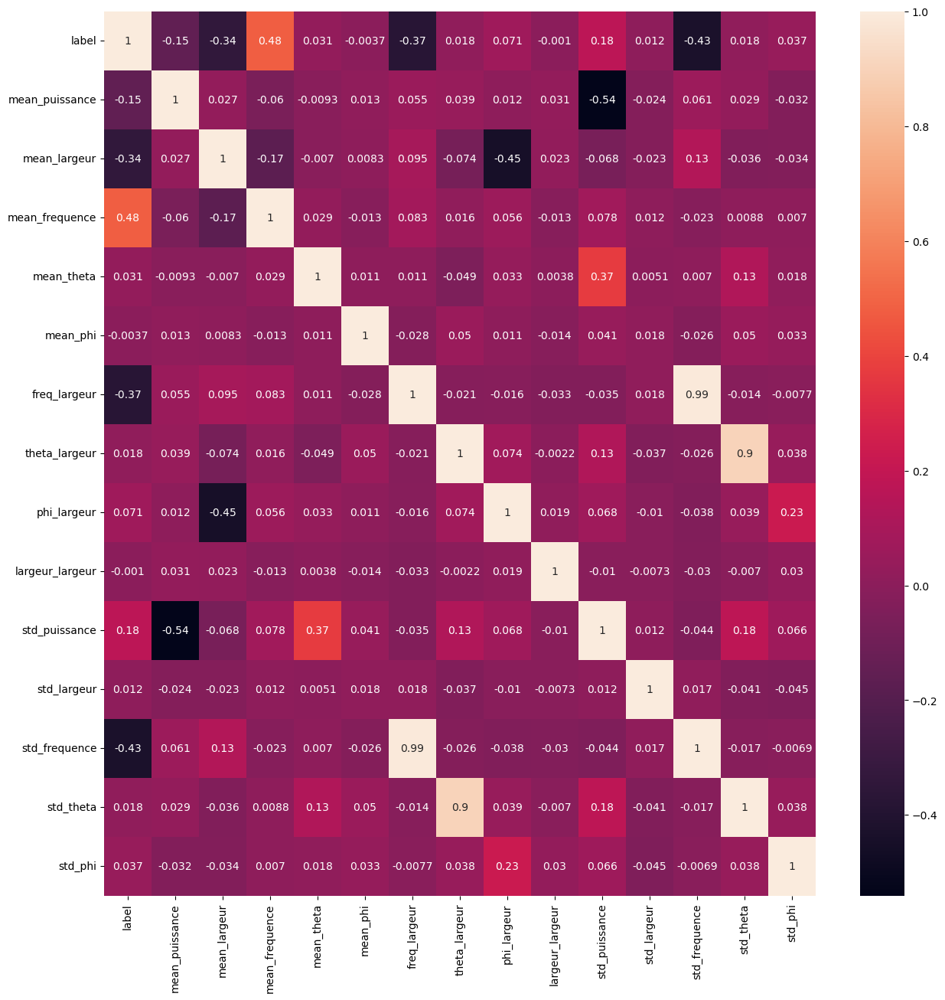

In [9]:
import pandas as pd
import seaborn as sns 
global_features_train = global_statistical_values(donnees_train)
global_features_test = global_statistical_values(donnees_test)

df = pd.DataFrame({
                   'label' : label_train,
                   **{lab : feature for (lab, feature) in zip(label_name, global_features_train.T)}
                })
corr = df.corr()
plt.figure(figsize=(15, 15))
sns.heatmap(corr, annot=True)
plt.show()

**On constate qu'il y a de fortes corrélations entre certains paramètres tels que std_frequence et largeur_frequence ou std_theta et theta_largeur**

c:\Users\U\anaconda3\envs\Pytorch\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


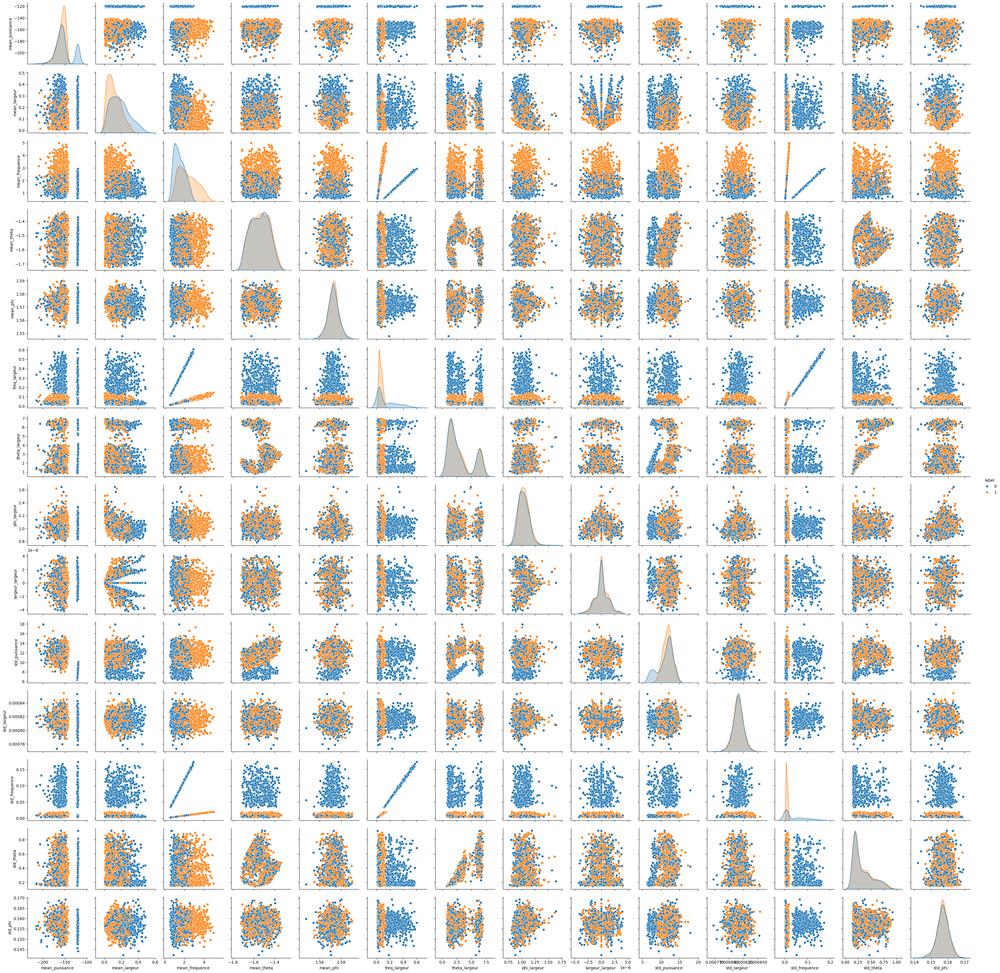

In [10]:
sns.pairplot(df, hue='label', diag_kind='kde')

**Il semble que la mesure de la moyenne des fréquences soit une mesure pertinente afin d'évaluer si le signal reçu est issu d'une menace ou non. Cette mesure constitue le critère principal de classification du modèle naïf.**

**De manière analogue au commentaire précédent, on remarque une démarquation claire entre certains paramètres tels que freq_largeur et std_frequence**

# Algorithme naïf

Meilleur score F1 avec les données test =  74.55121436114044 % Valeur du seuil =  2.3061224489795915


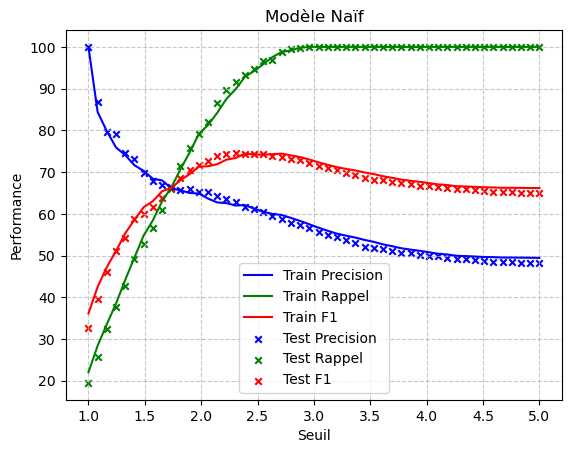

In [11]:
def modele_naif(seuil, donnees, labels):
    v_p, f_p, v_n, f_n = 0, 0, 0, 0
    for i in range(len(labels)):
        if np.mean(donnees["frequence"][i]) < seuil :
            if labels["pdw-"+str(i)] == 0:
                v_p +=1
            else:
                f_p +=1
        else:
            if labels["pdw-"+str(i)] == 1:
                v_n +=1
            else:
                f_n +=1
    precision = v_p/(v_p+f_p)*100
    rappel = v_p/(v_p+f_n)*100
    f1 = 2*precision*rappel/(precision+rappel)
    return np.array([precision, rappel, f1])


def meilleur_seuil(seuil, train, test, labels_train, labels_test):
    performance_train = np.zeros((len(seuil), 3))
    performance_test = np.zeros((len(seuil), 3))
    for i, s in enumerate(seuil):
        performance_train[i, :] = modele_naif(s, train, labels_train)
        performance_test[i, :] = modele_naif(s, test, labels_test)
    plt.figure()
    size1 = 14
    size2 = 22
    plt.plot(seuil, performance_train[:, 0], color = "blue", label = "Train Precision")
    plt.plot(seuil, performance_train[:, 1], color = "green", label = "Train Rappel")
    plt.plot(seuil, performance_train[:, 2], color = "red", label = "Train F1")
    plt.scatter(seuil, performance_test[:, 0], color = "blue", marker = "x", label = "Test Precision", s= size2)
    plt.scatter(seuil, performance_test[:, 1], color = "green", marker = "x", label = "Test Rappel", s= size2)
    plt.scatter(seuil, performance_test[:, 2], color = "red", marker = "x", label = "Test F1", s= size2)
    plt.legend()
    plt.xlabel("Seuil")
    plt.title("Modèle Naïf")
    plt.grid(True, linestyle='--', alpha=0.7)

    plt.ylabel("Performance")
    print("Meilleur score F1 avec les données test = ", max(performance_test[:, 2]), "%", "Valeur du seuil = ", seuil[np.argmax(performance_test[:, 2])])
    return max(performance_test[:, 2])
seuil = np.linspace(1, 5, 50)
seuil_optimal = meilleur_seuil(seuil, donnees_train, donnees_test, dict_train, dict_test)



**Le seuil de la fréquence moyenne du modèle naïf se situe à environ f = 2.3 GHz pour un score F1 de 74.5 %**

# Algorithme avec sklearn

In [12]:
from sklearn.model_selection import cross_val_score, GridSearchCV
from sklearn.datasets import make_circles, make_classification, make_moons
from sklearn.ensemble import AdaBoostClassifier, RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import confusion_matrix, classification_report
from tqdm import tqdm
from sklearn.metrics import accuracy_score, f1_score, make_scorer, recall_score
from sklearn.linear_model import LogisticRegression


In [13]:
classifiers = {
    "LogisticRegression" : LogisticRegression(),
    'RandomForestClassifier': RandomForestClassifier(random_state = 42),
    'AdaBoostClassifier': AdaBoostClassifier(),
}

In [14]:
def test_performance(grid, clf_name, clf, best_params, X_train, X_test, label_train, label_test):
    pipeline = grid.best_estimator_
    
    classifier = pipeline.named_steps[clf_name.lower()] 
    
    model_params = {key.split('__')[1]: value for key, value in best_params.items()}
    
    final_model = type(classifier)(**model_params, random_state=42)
    final_model.fit(X_train, label_train)  

    y_test_pred = final_model.predict(X_test)

    return label_test, y_test_pred

In [15]:
parameters = {
    "LogisticRegression" : {
    'logisticregression__C': np.linspace(0.0005, 0.005, 10), 
    'logisticregression__penalty': ['l2'],  
    'logisticregression__solver': ['lbfgs', 'liblinear', 'saga', 'newton-cg'],  
    'logisticregression__class_weight': [None, 'balanced'], 
    'logisticregression__tol': np.linspace(0.0005, 0.005, 8),  
    'logisticregression__max_iter': np.linspace(30, 60, 5, dtype = int),  
    },
    
    'RandomForestClassifier': {
        'randomforestclassifier__n_estimators':  np.linspace(130, 140, 4, dtype = int),
        'randomforestclassifier__max_depth': [9, 10, 11],
        'randomforestclassifier__min_samples_split': [4, 5, 7],
        'randomforestclassifier__min_samples_leaf': [1, 2],
    },
    
    
    'AdaBoostClassifier': {
        'adaboostclassifier__n_estimators': np.linspace(40, 90, 8, dtype = int),
        'adaboostclassifier__learning_rate': np.linspace(0.05, 0.5, 8),
        'adaboostclassifier__algorithm': ['SAMME', 'SAMME.R']
    },

}


In [16]:
X_train = global_features_train
X_test = global_features_test

In [17]:
performance = []
# iterate over classifiers
for clf_name, clf in (classifiers.items()):
    print(clf_name)
    clf = make_pipeline(StandardScaler(), clf)
    grid_search = GridSearchCV(clf, parameters[clf_name], cv=5, scoring='f1', n_jobs = -1)
    grid_search.fit(X_train, label_train)
    print("Best Cross-Validation parameters:", grid_search.best_params_)
    print("Best Cross-Validation F1:", grid_search.best_score_)

    label_test, y_test_pred = test_performance(grid_search, clf_name, type(clf), grid_search.best_params_, X_train, X_test, label_train, label_test)
    performance.append([label_test, y_test_pred])

LogisticRegression
Best Cross-Validation parameters: {'logisticregression__C': 0.002, 'logisticregression__class_weight': None, 'logisticregression__max_iter': 30, 'logisticregression__penalty': 'l2', 'logisticregression__solver': 'saga', 'logisticregression__tol': 0.0030714285714285717}
Best Cross-Validation F1: 0.8311616638236649
RandomForestClassifier


c:\Users\U\anaconda3\envs\Pytorch\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Best Cross-Validation parameters: {'randomforestclassifier__max_depth': 10, 'randomforestclassifier__min_samples_leaf': 1, 'randomforestclassifier__min_samples_split': 5, 'randomforestclassifier__n_estimators': 140}
Best Cross-Validation F1: 0.8707280028036678
AdaBoostClassifier
Best Cross-Validation parameters: {'adaboostclassifier__algorithm': 'SAMME.R', 'adaboostclassifier__learning_rate': 0.1142857142857143, 'adaboostclassifier__n_estimators': 68}
Best Cross-Validation F1: 0.8688923744796586


# Performances

In [18]:
recall, accuracy, f1 = [], [], []
algorithmes = ["Logistic Regression", "Random Forest Classifier", "Ada Boost Classifier"]

for i in range(len(performance)):
    recall.append(recall_score(performance[i][0], performance[i][1]))
    f1.append(f1_score(performance[i][0], performance[i][1]))
    accuracy.append(accuracy_score(performance[i][0], performance[i][1]))
    print("Performance de : ", algorithmes[i])
    print(classification_report(performance[i][0], performance[i][1]))
    print(confusion_matrix(performance[i][0], performance[i][1]))


Performance de :  Logistic Regression
              precision    recall  f1-score   support

           0       0.68      0.66      0.67       385
           1       0.70      0.71      0.70       415

    accuracy                           0.69       800
   macro avg       0.69      0.69      0.69       800
weighted avg       0.69      0.69      0.69       800

[[256 129]
 [120 295]]
Performance de :  Random Forest Classifier
              precision    recall  f1-score   support

           0       0.91      0.73      0.81       385
           1       0.79      0.93      0.85       415

    accuracy                           0.83       800
   macro avg       0.85      0.83      0.83       800
weighted avg       0.85      0.83      0.83       800

[[282 103]
 [ 29 386]]
Performance de :  Ada Boost Classifier
              precision    recall  f1-score   support

           0       0.91      0.72      0.80       385
           1       0.78      0.93      0.85       415

    accuracy    

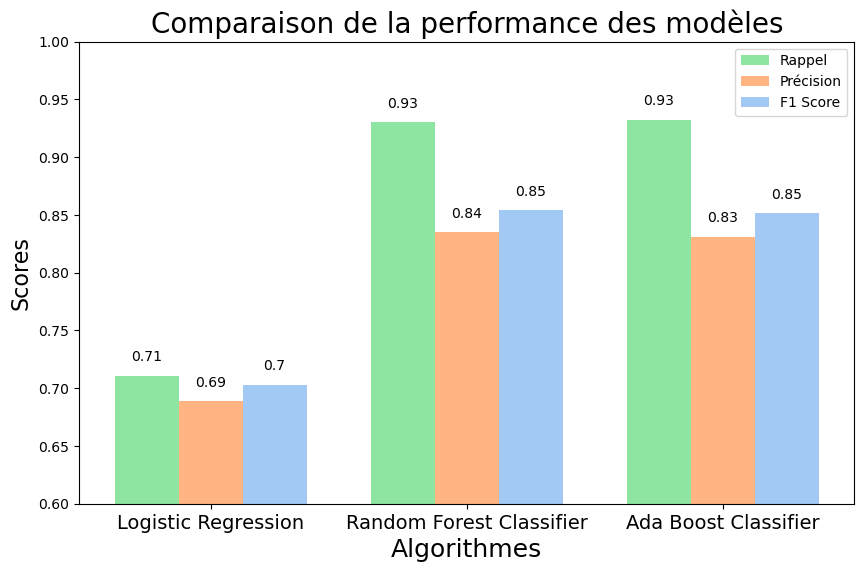

In [19]:
# sns.set_style("whitegrid")
# sns.set_palette("pastel")


x = np.arange(len(algorithmes))
width = 0.25  

plt.figure(figsize=(10, 6))
bars1 = plt.bar(x - width, recall, width, label="Rappel", color=sns.color_palette("pastel")[2])
bars2 = plt.bar(x, accuracy, width, label="Précision", color=sns.color_palette("pastel")[1])
bars3 = plt.bar(x + width, f1, width, label="F1 Score", color=sns.color_palette("pastel")[0])

plt.xlabel("Algorithmes", fontsize = 18)
plt.ylabel("Scores", fontsize = 16)
plt.title("Comparaison de la performance des modèles", fontsize = 20)
plt.xticks(x, algorithmes, fontsize = 14)  
plt.legend()
plt.ylim(0.6, 1)

for bars in [bars1, bars2, bars3]:
    for bar in bars:
        yval = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2, yval + 0.01, round(yval, 2), ha="center", va="bottom")

plt.show()


# Conclusion 

L'objectif de ce TP était de classifier des signaux radar. Nous avons construit un modèle naïf en imposant un seuil permettant de détecter les menaces. Le **score F1 obtenu est de 74,5%**.

Nous avons par la suite comparé des modèles plus élaborrés, qui nous ont permis d'atteindre un **score F1 de 85%**.

**Mission accomplie !**